In [3]:
import os, time, copy
from collections import OrderedDict
from glob import glob

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision.transforms as transforms
import torchvision.models as vmodels
import torchvision.datasets as vdatasets


import matplotlib.pyplot as plt
%matplotlib inline

import matplotlib.patches as patches
import matplotlib.font_manager as fm
path = '/Library/Fonts/NanumBarunGothicBold.ttf'
fontprop = fm.FontProperties(fname=path, size=18)

from PIL import Image as pil_image

import numpy as np
from skimage.transform import resize
from skimage.measure import label, regionprops


torch.manual_seed(42)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [4]:
BATCH_SIZE = 4

In [5]:
class Resnet_GAP(nn.Module):
    def __init__(self, base_model, nb_classes):
        super(Resnet_GAP, self).__init__()

        self.feature_extractor = nn.Sequential(*list(base_model.children())[:-2])

        self.gap = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(2048, nb_classes)
        
    def forward(self, inputs):
        features = self.feature_extractor(inputs)
        x = self.gap(features)
        x = self.fc(x.view(inputs.size()[0], -1))
        return x, features

In [6]:
base_model = vmodels.resnet50(pretrained=False)
net = Resnet_GAP(base_model, 5)
net.load_state_dict(torch.load("../weights/pred_fullyconv/cam/best_model_e19_val_acc0.93.pth.tar", map_location='cpu'))
net.eval()
net.to(device)

Resnet_GAP(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (downsample): Sequential(
          (0): Conv2d(6

In [7]:
# image_datasets['train'].class_to_idx

In [8]:
img_path = "samples/ahn1.JPG"
cls = 0

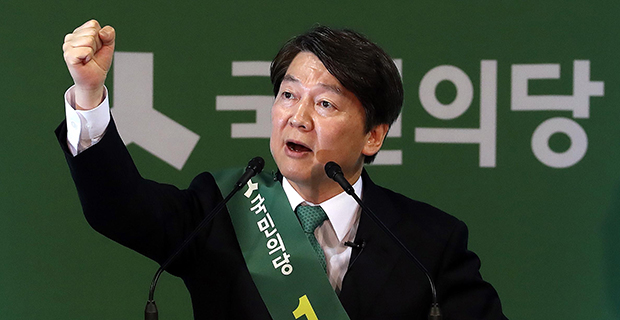

In [9]:
pil_image.open(img_path)

In [10]:
test_transforms = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

cls2name = {0: '안철수', 1: '홍준표', 2:'문재인', 3:'심상정', 4:'유승민'}
cls2color = {0: 'green', 1: 'red', 2:'blue', 3:'yellow', 4:'teal'}

In [11]:
def run_inference(img_path, is_heatmap, save=False, save_dir=None):
    img = pil_image.open(img_path)
    img_array = np.asarray(img)[:, :, :3]
    n_H, n_W, n_C = img_array.shape
    
    if n_W > n_H:
        scaleFactor = (int(1024*n_H / n_W), 1024)
    else:
        scaleFactor = (1024, int(1024*n_W / n_H))
    
    img_array = resize(img_array, scaleFactor)
    n_H, n_W, n_C = img_array.shape
    
    to_feed = copy.deepcopy(img_array)
    inp_tensor = test_transforms(to_feed).unsqueeze(0).float()
    inp_tensor = inp_tensor.to(device)
    
    output, features = net(inp_tensor)
    softmax_output = F.softmax(output, dim=1)
    print(softmax_output)
    thres_output = ((softmax_output.detach() >= 0.4).numpy()[0])
    extracted_labels = np.where(thres_output > 0)[0].tolist()
    print(extracted_labels)
    
    
    fig, ax = plt.subplots(figsize=(12, 10))
    ax.imshow(img_array)
    ax.axis("off")
    
    if len(extracted_labels) > 0:
        
        for cls in extracted_labels:
            
            
            class_weights = net.fc.weight[cls, :].unsqueeze(1).unsqueeze(1)

            cam = (features[0] * class_weights).sum(dim=0).detach().numpy()

            _min = cam.min()
            _max = cam.max()
            cam = (cam - _min) / (_max - _min)
        
#             canvas = resize(cam, (n_H, n_W))
            canvas = resize(cam, scaleFactor)
            
            if is_heatmap:
                ax.imshow(canvas, cmap='jet', alpha=0.5)
            else:
                labeled = label(canvas > 0.5)
                props = regionprops(labeled)
                
                rects = []
                print(props)
                for p in props:
                    print(p.bbox)
                    ys, xs, ye, xe = p.bbox
                    w = xe - xs
                    h = ye - ys
                    
                    if w * h > 3000:
                        
                        rect = patches.Rectangle((xs, ys), w, h, linewidth=3, edgecolor=cls2color[cls], facecolor='none', alpha=0.75)
                        rects.append(rect)
                        ax.text(x=xs + 5, y=ys + 23, s=cls2name[cls], fontproperties=fontprop, color=cls2color[cls])

                for r in rects:
                    ax.add_patch(r)
                    
    
    if save:
        fname = os.path.basename(img_path)
        full_path = os.path.join(save_dir, fname)
        fig.savefig(full_path, bbox_inches='tight')
        print("saved - {}".format(full_path))
    else:
        plt.show()

/Users/jastills/anaconda3/envs/pytorch/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/jastills/anaconda3/envs/pytorch/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


tensor([[ 0.3783,  0.1974,  0.1161,  0.0885,  0.2197]])
[]


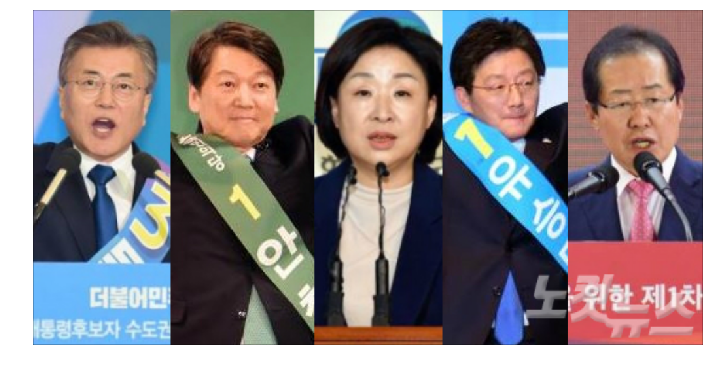

In [15]:
run_inference("samples/all.jpg", is_heatmap=True, save=False, save_dir='video_res')
# run_inference("../datasets/presidential_debate_frames_v2/frame040.jpg", is_heatmap=False, save=False, save_dir=None)

In [16]:
paths = glob("samples/*.jpg")

/Users/jastills/anaconda3/envs/pytorch/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/jastills/anaconda3/envs/pytorch/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


tensor([[ 0.7595,  0.0187,  0.1286,  0.0435,  0.0498]])
[0]


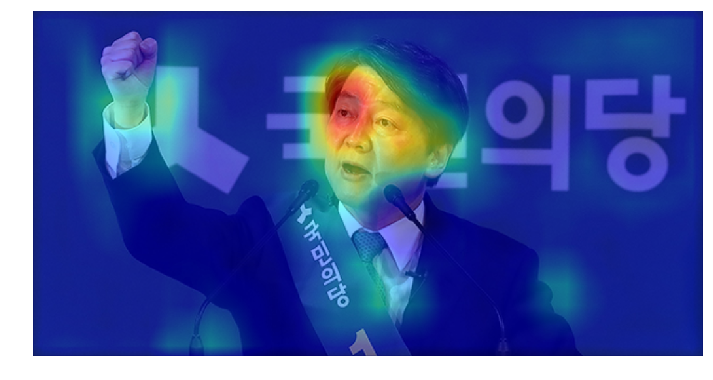

tensor([[ 0.7794,  0.0166,  0.0702,  0.0953,  0.0385]])
[0]


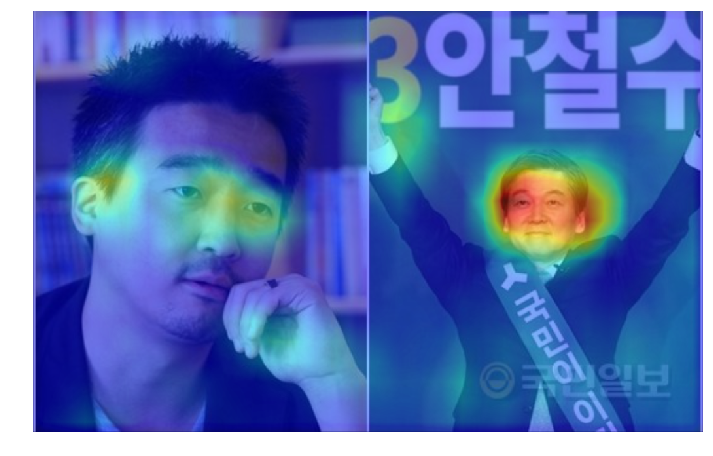

tensor([[ 0.7170,  0.0275,  0.1102,  0.0554,  0.0899]])
[0]


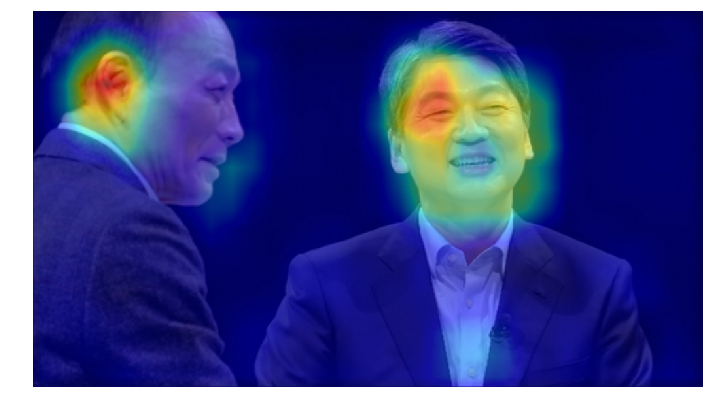

tensor([[ 0.3783,  0.1974,  0.1161,  0.0885,  0.2197]])
[]


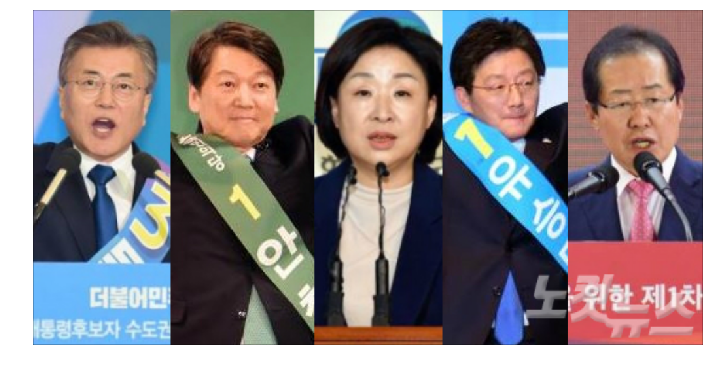

tensor([[ 0.2878,  0.1807,  0.1179,  0.0976,  0.3160]])
[]


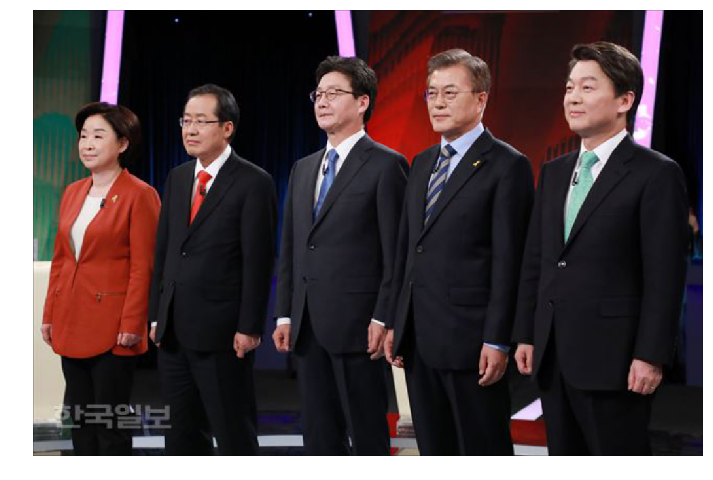

tensor([[ 0.1487,  0.1099,  0.3729,  0.0357,  0.3328]])
[]


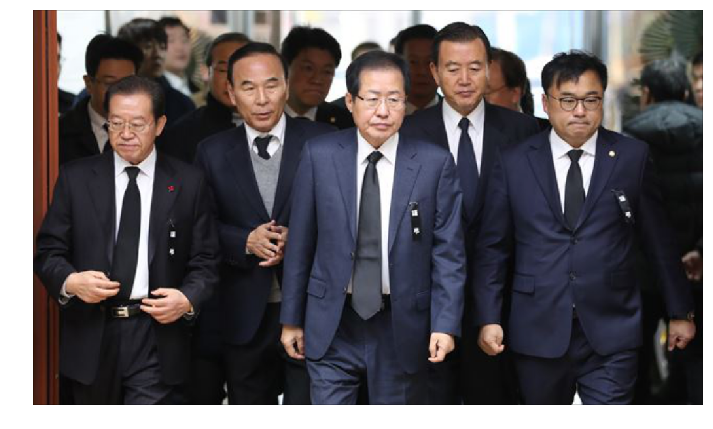

tensor([[ 0.2610,  0.2640,  0.1809,  0.0952,  0.1988]])
[]


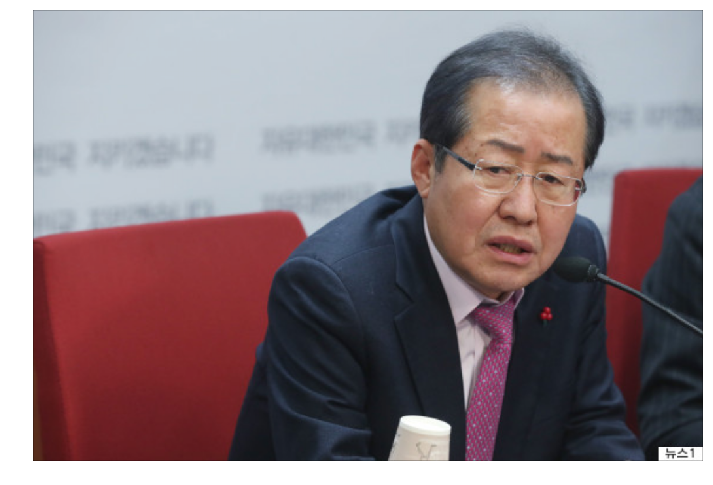

tensor([[ 0.2845,  0.3670,  0.1219,  0.1132,  0.1135]])
[]


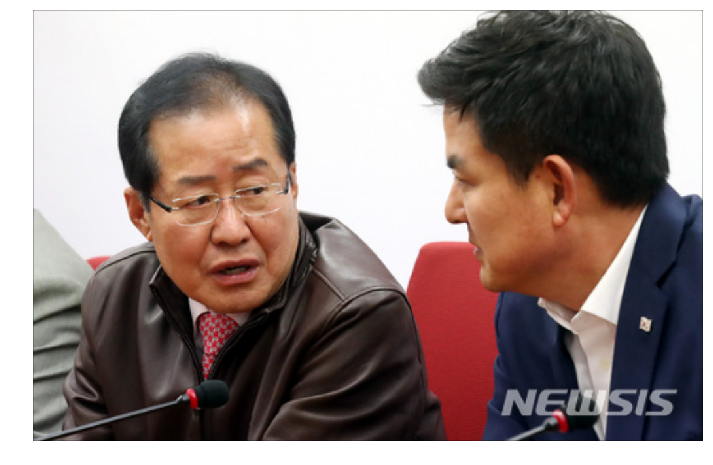

tensor([[ 0.3224,  0.0188,  0.4853,  0.0570,  0.1165]])
[2]


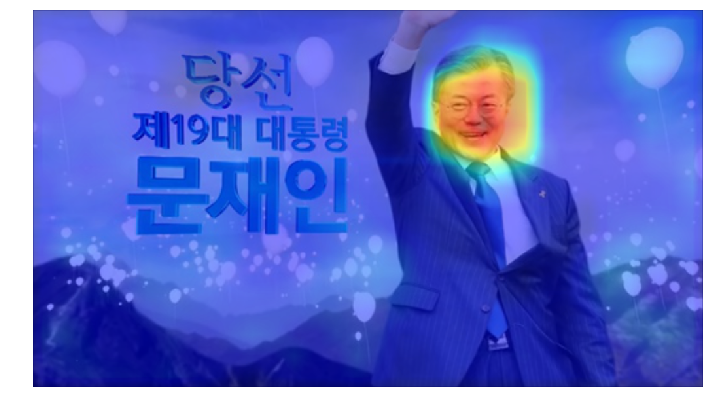

tensor([[ 0.2372,  0.0849,  0.4651,  0.0725,  0.1403]])
[2]


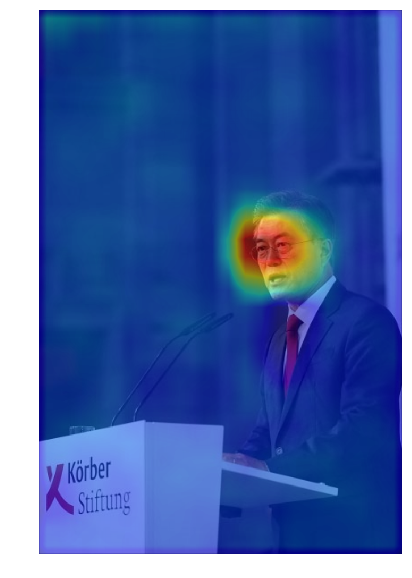

tensor([[ 0.1791,  0.0477,  0.0751,  0.5906,  0.1075]])
[3]


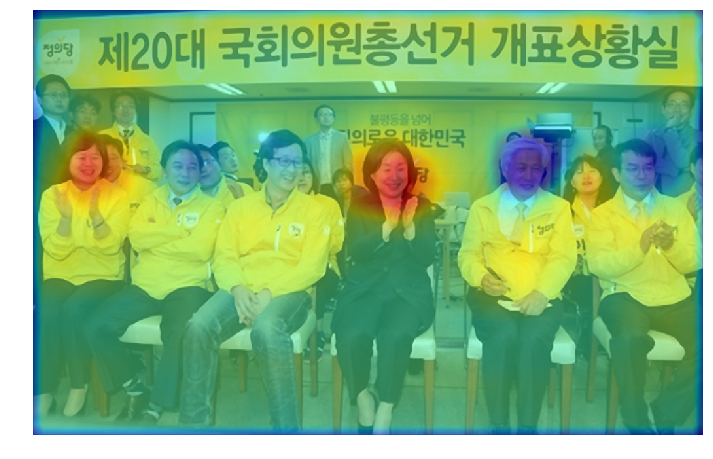

tensor([[ 0.1338,  0.0446,  0.0680,  0.6867,  0.0668]])
[3]


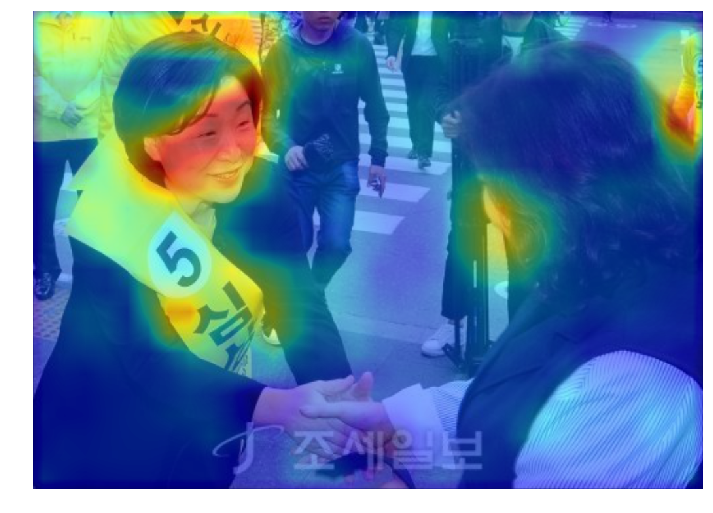

tensor([[ 0.1405,  0.0202,  0.0614,  0.6863,  0.0916]])
[3]


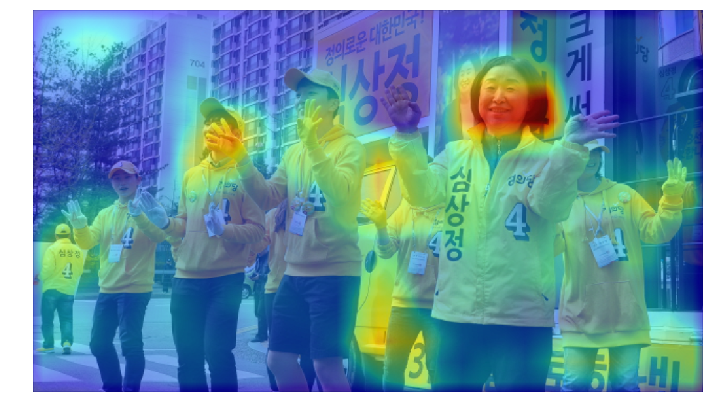

tensor([[ 0.2440,  0.1489,  0.1461,  0.1522,  0.3087]])
[]


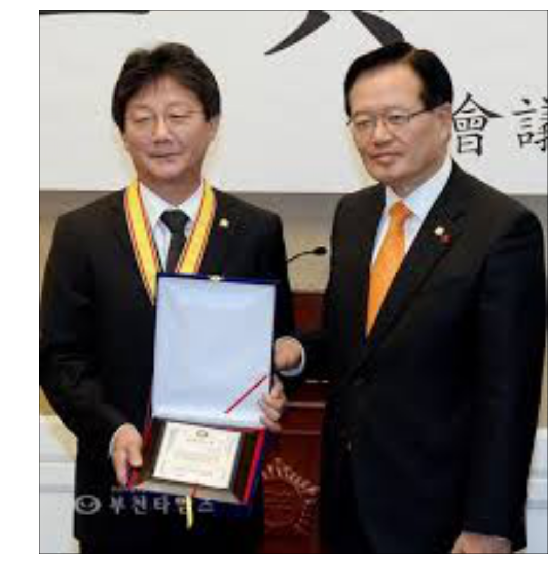

tensor([[ 0.2816,  0.0337,  0.3809,  0.0350,  0.2688]])
[]


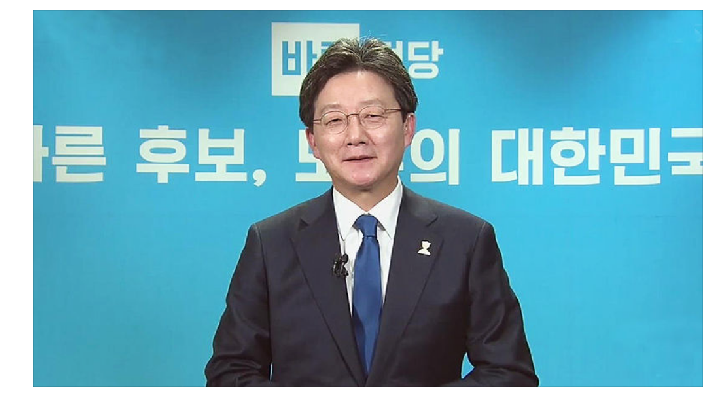

tensor([[ 0.5259,  0.0861,  0.0477,  0.0390,  0.3012]])
[0]


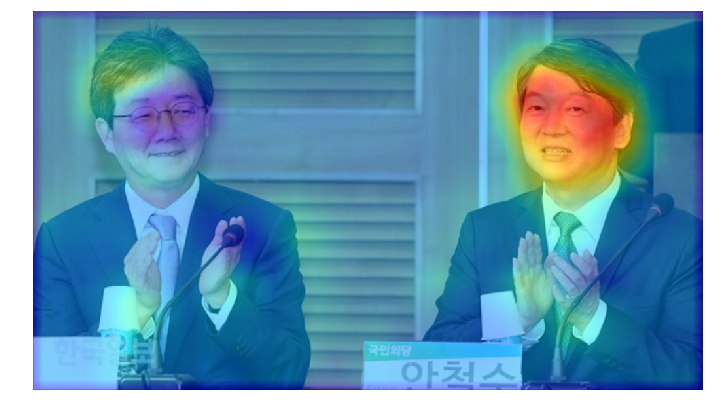

In [18]:
for p in paths:
    run_inference(p, is_heatmap=True, save=False, save_dir=None)

In [56]:
paths = sorted(glob("../datasets/presidential_debate_frames_v2/*.jpg"))

[]
saved - video_res_cam/frame000.jpg
[]
saved - video_res_cam/frame001.jpg
[]
saved - video_res_cam/frame002.jpg
[]
saved - video_res_cam/frame003.jpg
[2]
saved - video_res_cam/frame004.jpg


/Users/jastills/anaconda3/envs/pytorch/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/jastills/anaconda3/envs/pytorch/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


[2]
saved - video_res_cam/frame005.jpg
[]
saved - video_res_cam/frame006.jpg
[]
saved - video_res_cam/frame007.jpg
[4]
saved - video_res_cam/frame008.jpg
[]
saved - video_res_cam/frame009.jpg
[4]
saved - video_res_cam/frame010.jpg
[4]
saved - video_res_cam/frame011.jpg
[4]
saved - video_res_cam/frame012.jpg
[4]
saved - video_res_cam/frame013.jpg
[]
saved - video_res_cam/frame014.jpg
[]
saved - video_res_cam/frame015.jpg
[]
saved - video_res_cam/frame016.jpg
[4]
saved - video_res_cam/frame017.jpg
[4]
saved - video_res_cam/frame018.jpg
[4]
saved - video_res_cam/frame019.jpg
[4]
saved - video_res_cam/frame020.jpg


/Users/jastills/anaconda3/envs/pytorch/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


[4]
saved - video_res_cam/frame021.jpg
[4]
saved - video_res_cam/frame022.jpg
[4]
saved - video_res_cam/frame023.jpg
[4]
saved - video_res_cam/frame024.jpg
[4]
saved - video_res_cam/frame025.jpg
[]
saved - video_res_cam/frame026.jpg
[4]
saved - video_res_cam/frame027.jpg
[]
saved - video_res_cam/frame028.jpg
[4]
saved - video_res_cam/frame029.jpg
[4]
saved - video_res_cam/frame030.jpg
[4]
saved - video_res_cam/frame031.jpg
[4]
saved - video_res_cam/frame032.jpg
[4]
saved - video_res_cam/frame033.jpg
[4]
saved - video_res_cam/frame034.jpg
[4]
saved - video_res_cam/frame035.jpg
[4]
saved - video_res_cam/frame036.jpg
[0]
saved - video_res_cam/frame037.jpg
[4]
saved - video_res_cam/frame038.jpg
[4]
saved - video_res_cam/frame039.jpg


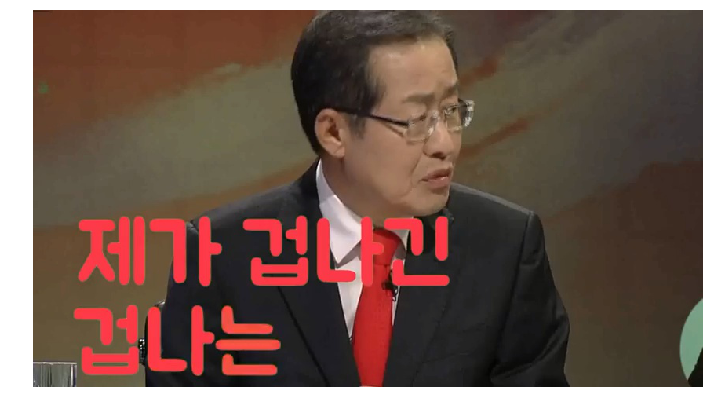

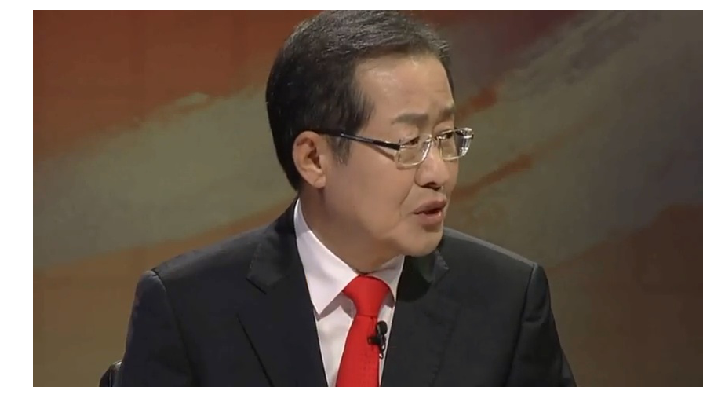

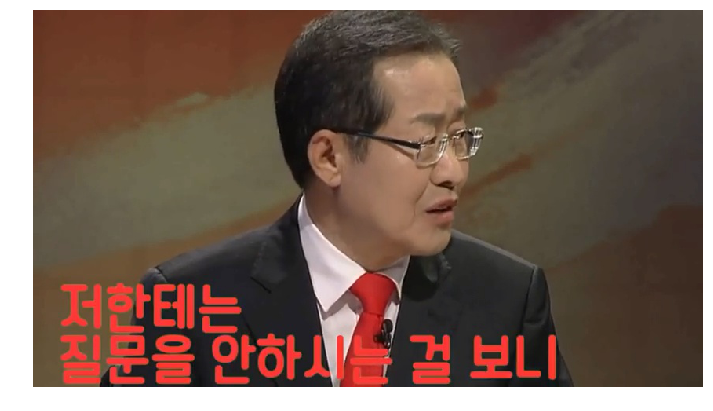

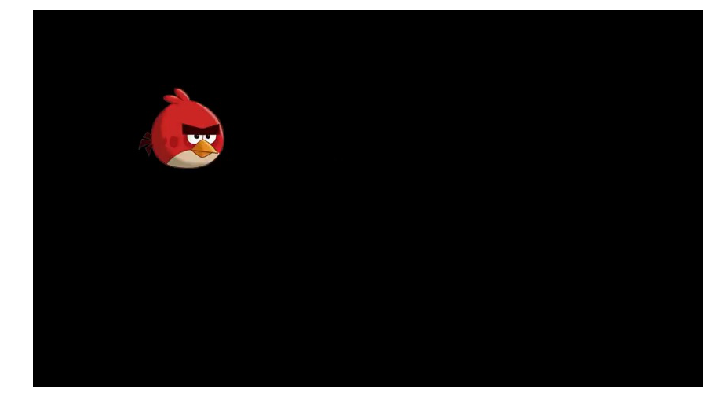

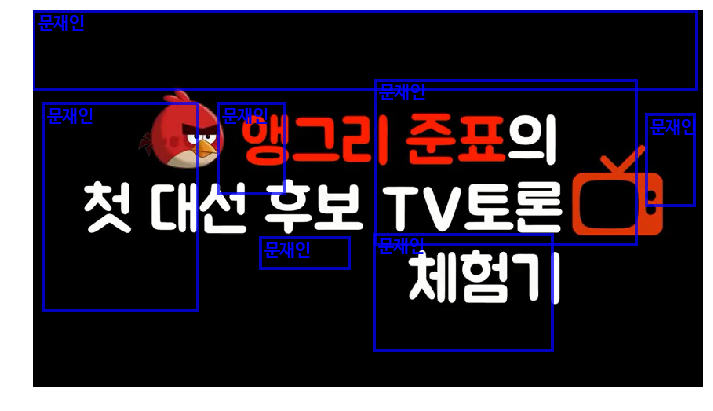

...

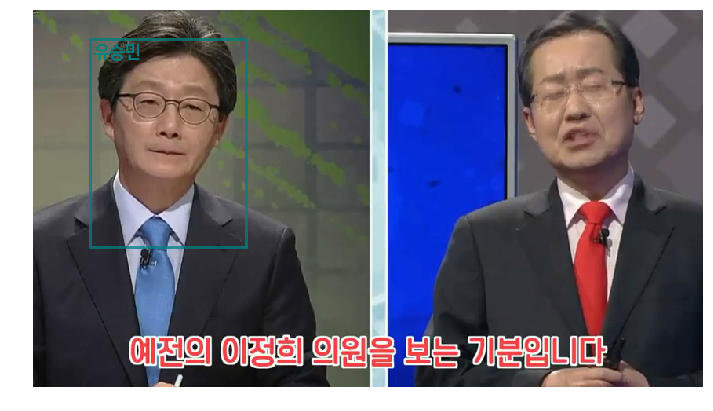

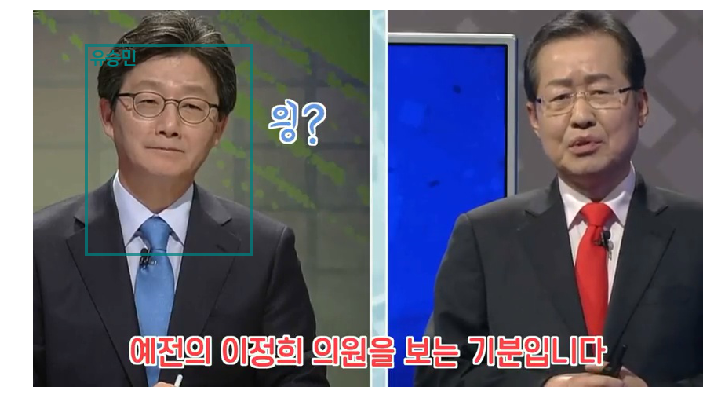

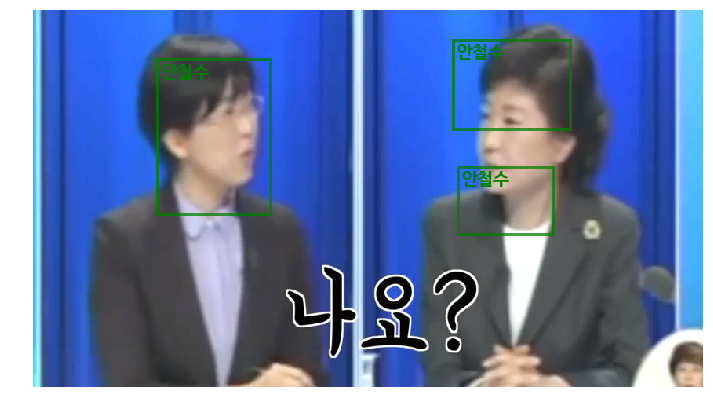

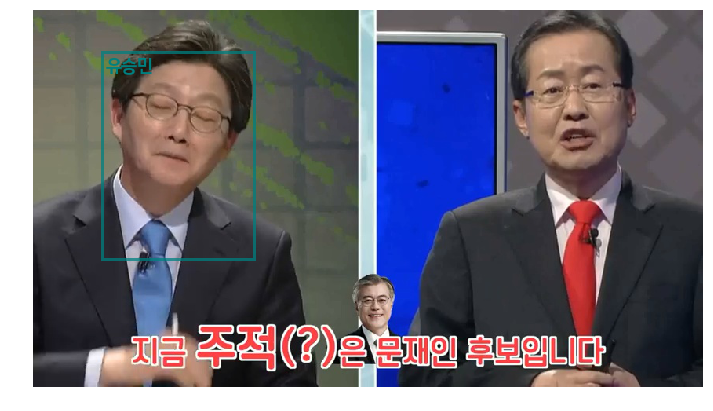

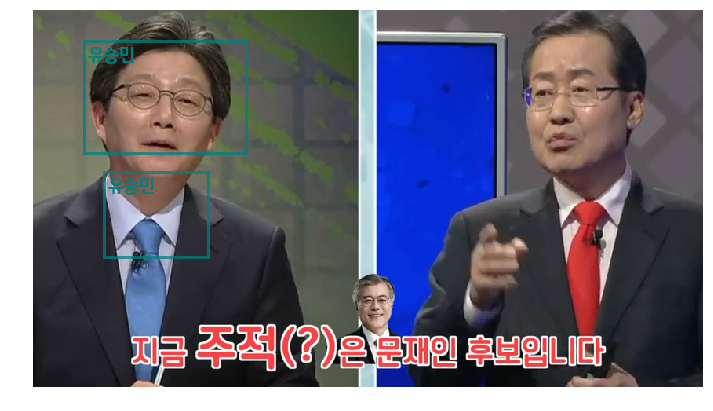

In [57]:
for p in paths[:40]:
    run_inference(p, is_heatmap=False, save=True, save_dir='video_res_cam')